In [105]:
#Required libraries imported

In [4]:
import tflearn.datasets.oxflower17 as oxflower17 
import numpy as np
import tflearn
import pandas as pd
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import cv2
from pigeon import annotate
from keras.callbacks import ModelCheckpoint,ReduceLROnPlateau
import pigeonXT as pixt
from IPython.display import display, Image
import warnings
from mpl_toolkits.axes_grid1 import ImageGrid
from pigeon import annotate
import pigeonXT as pixt
from IPython.display import display, Image
from sklearn.model_selection import RandomizedSearchCV
from tensorflow.keras.models import Sequential, save_model, load_model
from keras.applications import xception
import cv2
from matplotlib import pyplot
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from tensorflow.keras.layers import InputLayer
from keras.utils import to_categorical
from tqdm import tqdm
from keras.preprocessing import image
from sklearn.model_selection import train_test_split
from keras import layers
from keras import models
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array, load_img
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers. normalization import BatchNormalization
from keras.optimizers import RMSprop
from tensorflow.keras import optimizers,regularizers
from keras.layers import Dense ,Dropout,BatchNormalization, Activation
import pickle
import random
import tarfile
from sklearn.model_selection import train_test_split
from keras.layers import Dense ,Dropout,BatchNormalization, Activation
import pickle
import random
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV
import urllib
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import GridSearchCV
from PIL import Image
import warnings
warnings.filterwarnings("ignore")
sns.set(color_codes=True)
import shutil
%matplotlib inline

Instructions for updating:
non-resource variables are not supported in the long term


# Part 1
- <b>Objective</b>: University’s management require an automation which can create a classifier capable of determining a plant's species from a photo.

### Importing the data. Analyzing the dimensions of the data. Visualizing the data.

In [113]:
image_size = 64

In [107]:
train_img = 'train'
classes = {}
for class_name in os.listdir(train_img):
    classes[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
print(classes)

{'Black-grass': 263, 'Charlock': 390, 'Cleavers': 287, 'Common Chickweed': 611, 'Common wheat': 221, 'Fat Hen': 475, 'Loose Silky-bent': 671, 'Maize': 221, 'Scentless Mayweed': 516, 'Shepherds Purse': 231, 'Small-flowered Cranesbill': 496, 'Sugar beet': 385}


In [108]:
categories = os.listdir(train_img)
categories

['Black-grass',
 'Charlock',
 'Cleavers',
 'Common Chickweed',
 'Common wheat',
 'Fat Hen',
 'Loose Silky-bent',
 'Maize',
 'Scentless Mayweed',
 'Shepherds Purse',
 'Small-flowered Cranesbill',
 'Sugar beet']

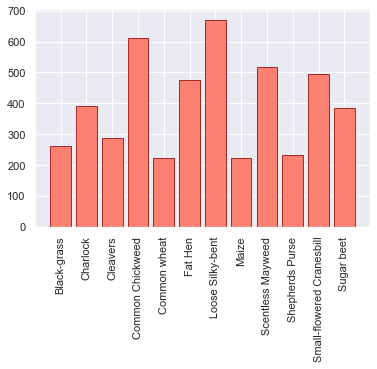

In [109]:
plt.bar(classes.keys(), classes.values(), color = 'salmon', edgecolor = 'brown')
plt.xticks(rotation=90)

plt.show()

 - The train data has 12 categories of plant seedling species. 
 - The species images collected for training the model are BlacK-grass, Charlock, Cleavers, Common Chickweed, Common Wheat, Fat Hen, Loose Silky-bent, Maize, Scentless Mayweed, Shepherds Purse, Small-flowered Cranesbill and Sugarbeet.
 - Highest number of image samples are collected for Loose Silky-bent plant species.
 - Different number of image samples are collected for each of the species ranging from 250 to 690.

In [111]:
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
#     validation_split=0.2
)

In [114]:
train_gen = imgen.flow_from_directory('train',
                                                    target_size=(image_size, image_size),                                        
                                                    class_mode='categorical',
#                                                     batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=1
                                                )

Found 4767 images belonging to 12 classes.


In [115]:
x,y = next(train_gen)

In [116]:
def show_grid(image_list, nrows, ncols, label_list=None, show_labels=False, figsize=(10,20)):

    fig = plt.figure(None, figsize,frameon=False)
    grid = ImageGrid(fig, 111, 
                     nrows_ncols=(nrows, ncols),  
                     axes_pad=0.1, 
                     share_all=True,
                     )
    for i in range(nrows*ncols):
        ax = grid[i]
        ax.imshow(image_list[i],cmap='Greys_r')
        ax.axis('off')

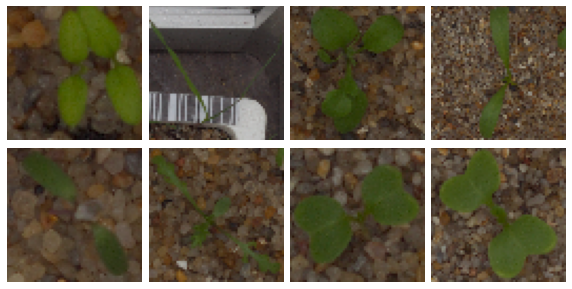

In [117]:
show_grid(x,2,4,show_labels=True,figsize=(10,20))

In [118]:
train_data = []
for category_id, category in enumerate(categories):
    for file in os.listdir(os.path.join(train_img, category)):
        train_data.append(['train/{}/{}'.format(category, file), category_id, category])
train = pd.DataFrame(train_data, columns=['imagefile', 'category_id', 'category'])
train.shape

(4767, 3)

In [119]:
train.head()

,imagefile,category_id,category
0,train/Black-grass/0050f38b3.png,0,Black-grass
1,train/Black-grass/0183fdf68.png,0,Black-grass
2,train/Black-grass/0260cffa8.png,0,Black-grass
3,train/Black-grass/05eedce4d.png,0,Black-grass
4,train/Black-grass/075d004bc.png,0,Black-grass


In [120]:
test = []
test_img = 'test'
#count = 0

for file in os.listdir(test_img):
  #renamed_to = str(count)+'.png'
  test.append(['test/{}'.format(file),file])
  #os.rename((test_dir+file),(test_dir+renamed_to))
  #count = count + 1
test = pd.DataFrame(test, columns=['filepath','file'])
test.shape

(794, 2)

In [121]:
test.head()

,filepath,file
0,test/0021e90e4.png,0021e90e4.png
1,test/003d61042.png,003d61042.png
2,test/007b3da8b.png,007b3da8b.png
3,test/0086a6340.png,0086a6340.png
4,test/00c47e980.png,00c47e980.png


In [122]:
categories = ['Black-grass', 'Charlock', 'Cleavers', 'Common Chickweed', 'Common wheat', 'Fat Hen', 'Loose Silky-bent', 'Maize', 'Scentless Mayweed', 'Shepherds Purse', 'Small-flowered Cranesbill', 'Sugar beet']
len(categories)

12

In [123]:
def create_mask_for_plant(image):
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    sensitivity = 35
    lower_hsv = np.array([60 - sensitivity, 100, 50])
    upper_hsv = np.array([60 + sensitivity, 255, 255])

    mask = cv2.inRange(image_hsv, lower_hsv, upper_hsv)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11,11))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    
    return mask

def segment_plant(image):
    mask = create_mask_for_plant(image)
    output = cv2.bitwise_and(image, image, mask = mask)
    return output

def sharpen_image(image):
    image_blurred = cv2.GaussianBlur(image, (0, 0), 3)
    image_sharp = cv2.addWeighted(image, 1.5, image_blurred, -0.5, 0)
    return image_sharp

In [124]:
dir = 'train'
categories

['Black-grass',
 'Charlock',
 'Cleavers',
 'Common Chickweed',
 'Common wheat',
 'Fat Hen',
 'Loose Silky-bent',
 'Maize',
 'Scentless Mayweed',
 'Shepherds Purse',
 'Small-flowered Cranesbill',
 'Sugar beet']

In [125]:
data = []

for category in categories:
    path = os.path.join(dir,category)
    label = categories.index(category)
    
    for img in os.listdir(path):
        try:
            flower_img = cv2.imread(os.path.join(path, img))
            flower_img = cv2.resize(flower_img,(image_size,image_size))
            flower_img = segment_plant(flower_img)
            flower_img = sharpen_image(flower_img)
            flower_img = cv2.cvtColor(flower_img, cv2.COLOR_RGB2GRAY )
            data.append([flower_img,label])
        except Exception as e:
            pass

print(len(data))

4767


In [126]:
lenofimage = len(data)
lenofimage

4767

In [127]:
features = []
labels = []

In [128]:
for feature,label in data:
    features.append(feature)
    labels.append(label)
     
features = np.array(features).reshape(len(data),-1)

In [129]:
labels = np.array(labels)

In [130]:
print('Max' , features.max())
print('Min' , features.min())

Max 255
Min 0


In [131]:
features = features/255

In [132]:
features.shape

(4767, 4096)

In [133]:
labels.shape

(4767,)

### Training, tuning and testing AIML image classifier model using:
 - Supervised learning algorithms for training
 - Neural networks for training
 - CNN for training

In [134]:
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.30)

In [136]:
# variables to hold the results and names
results = []
names = []
scoring = "accuracy"

In [137]:
# no.of.trees for Random Forests
num_trees = 100
# create all the machine learning models
models = []
models.append(('LR', LogisticRegression(random_state=9)))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier(random_state=9)))
models.append(('RF', RandomForestClassifier(n_estimators=num_trees, random_state=9)))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(random_state=9)))

In [138]:
# %%time
# filter all the warnings
import warnings
warnings.filterwarnings('ignore')
X_train, y_train
# 10-fold cross validation
for name, model in models:
    kfold = KFold(n_splits=5, random_state=None)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.394483 (0.025176)
KNN: 0.446958 (0.039450)
CART: 0.321347 (0.008717)
RF: 0.580638 (0.027885)
NB: 0.264995 (0.021565)
SVM: 0.569548 (0.027137)


In [139]:
results

[array([0.3997006 , 0.44077961, 0.37631184, 0.37031484, 0.38530735]),
 array([0.39520958, 0.49625187, 0.40629685, 0.46176912, 0.47526237]),
 array([0.30688623, 0.33133433, 0.32683658, 0.31634183, 0.32533733]),
 array([0.57185629, 0.62818591, 0.57271364, 0.54272864, 0.58770615]),
 array([0.24101796, 0.30284858, 0.24887556, 0.26086957, 0.27136432]),
 array([0.55838323, 0.62068966, 0.55772114, 0.54122939, 0.56971514])]

### Neural network

In [106]:
train_dir = 'train'
test_dir = 'test'

train_Blackgrass = ['../train/Black-grass/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Black-grass'))]  #get Black-grass images
train_Charlock = ['../train/Charlock/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Charlock'))]  #get Black-grass images
train_Cleavers = ['../train/Cleavers/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Cleavers'))]  #get Black-grass images
train_CommonChickweed = ['../train/Common Chickweed/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Common Chickweed'))]  #get Black-grass images
train_Commonwheat = ['../train/Common wheat/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Common wheat'))]  #get Black-grass images
train_FatHen = ['../train/Fat Hen/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Fat Hen'))]  #get Black-grass images
train_LooseSilkybent = ['../train/Loose Silky-bent/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Loose Silky-bent'))]  #get Black-grass images
train_Maize = ['../train/Maize/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Maize'))]  #get Black-grass images
train_ScentlessMayweed = ['../train/Scentless Mayweed/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Scentless Mayweed'))]  #get Black-grass images
train_ShepherdsPurse = ['../train/Shepherds Purse/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Shepherds Purse'))]  #get Black-grass images
train_SmallfloweredCranesbill = ['../train/Small-flowered Cranesbill/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Small-flowered Cranesbill'))]  #get Black-grass images
train_Sugarbeet = ['../train/Sugar beet/{}'.format(i) for i in os.listdir(os.path.join(train_dir, 'Sugar beet'))]  #get Black-grass images

test_imgs = ['../test/{}'.format(i) for i in os.listdir(test_dir)] #get test images

train_imgs = train_Blackgrass + train_Charlock + train_Cleavers + train_CommonChickweed + train_Commonwheat + train_FatHen + train_LooseSilkybent + \
train_Maize + train_ScentlessMayweed + train_ShepherdsPurse + train_SmallfloweredCranesbill+ train_Sugarbeet
random.shuffle(train_imgs)  # shuffle it randomly

# train_imgs
# test_imgs

In [107]:
nrows = 150
ncolumns = 150
channels = 3 

In [108]:
def read_and_process_image(list_of_images):
    """
    Returns two arrays: 
        X is an array of resized images
        y is an array of labels
    """
    X = [] # images
    y = [] # labels
#     print(list_of_images)

    for category in categories:
        path = os.path.join(train_dir,category)
    
        for image in os.listdir(path):
            label = categories.index(category)
            y.append(label)
            
#             X.append(cv2.resize(, (nrows,ncolumns), interpolation=cv2.INTER_CUBIC))
#         
#             X.append(flower_img)
            X.append(cv2.resize(cv2.imread(os.path.join(path, image)), (nrows,ncolumns), interpolation=cv2.INTER_CUBIC))
            
    return X, y

In [109]:
X, y = read_and_process_image(train_imgs)

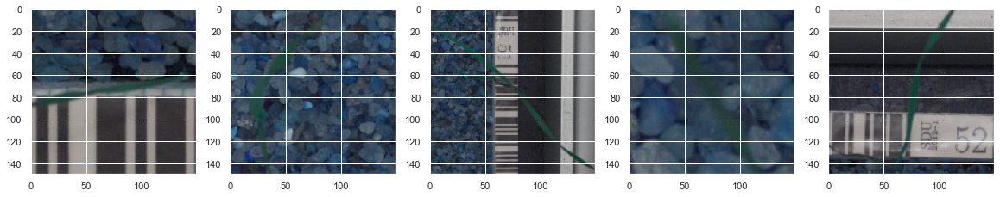

In [110]:
plt.figure(figsize=(20,10))
columns = 5
for i in range(columns):
    plt.subplot(5 / columns + 1, columns, i + 1)
    plt.imshow(X[i])

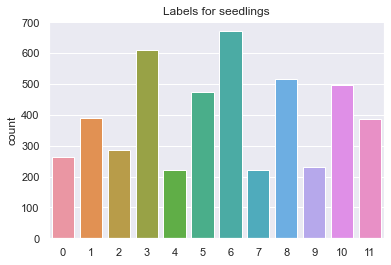

In [111]:
#Convert list to numpy array
X = np.array(X)
y = np.array(y)

sns.countplot(y)
plt.title('Labels for seedlings')
plt.show()

In [112]:
print("Shape of train images is:", X.shape)
print("Shape of labels is:", y.shape)

Shape of train images is: (4767, 150, 150, 3)
Shape of labels is: (4767,)


In [113]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=2)

print("Shape of train images is:", X_train.shape)
print("Shape of validation images is:", X_test.shape)
print("Shape of labels is:", y_train.shape)
print("Shape of labels is:", y_test.shape)


Shape of train images is: (3813, 150, 150, 3)
Shape of validation images is: (954, 150, 150, 3)
Shape of labels is: (3813,)
Shape of labels is: (954,)


In [114]:
# convert the labels from integers to vectors
y_train = to_categorical(y_train, num_classes=12)
y_test = to_categorical(y_test, num_classes=12)
print(y_train)
print(y_test.shape)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(954, 12)


In [115]:
#get the length of the train and validation data
ntrain = len(X_train)
ntest = len(X_test)


In [116]:
configuration = {
    'train_path_org': 'train',
    'test_path': 'test/',
    
    'validation_split': 0.25,
    'batch_size': 40,
    'img_height': 150,
    'img_width': 150,
    'num_classes' : 12,
    
    'drop_out_rate': 0.2,
    'epochs': 50,
    'checkpoints' : ModelCheckpoint('../weights.best_{epoch:02d}-{val_acc:.2f}.hdf5',
                                    monitor='val_acc', 
                                    verbose=1, 
                                    save_best_only=True, 
                                    mode='max'),

    'checkpoints_full' : ModelCheckpoint('../weights.last_auto4.hdf5', 
                                         monitor='val_acc', 
                                         verbose=1, 
                                         save_best_only=False,
                                         mode='max'),
    'early_stopping': tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                    mode='auto',
                                    verbose=1,
                                    patience=5),
    'reduce_lr_on_platue': tf.keras.callbacks.ReduceLROnPlateau(monitor='val_acc', 
                                    patience=3,
                                    verbose=1,
                                    factor=.4, 
                                    min_lr=0.0000001),

    'accuracy': ['accuracy'],
}

In [117]:
train_datagen = ImageDataGenerator(rescale=1./255,   #Scale the image between 0 and 1
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,)

test_datagen = ImageDataGenerator(rescale=1./255)  #We do not augment validation data. we only perform rescale

In [118]:
train_generator = train_datagen.flow(X_train, y_train, batch_size=configuration['batch_size'])
test_generator = test_datagen.flow(X_test, y_test, batch_size=configuration['batch_size'])

print(ntrain)
print(ntest)

3813
954


In [119]:
def NN_model(train_generator, test_generator, lrate):

    model = Sequential()

    model.add(InputLayer(input_shape=(configuration['img_height'],configuration['img_width'],3)))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(configuration['drop_out_rate']))

    model.add(Dense(40, activation='relu'))

    model.add(Dense(25, activation='relu'))
    
    model.add(Flatten())

    model.add(Dense(configuration['num_classes'], activation='softmax'))

    model.summary()
    # compile model
    model.compile(loss='categorical_crossentropy', optimizer= tf.keras.optimizers.Adam(lrate), metrics=['acc'])
   
    
    history = model.fit(train_generator, validation_data = test_generator, epochs = 10, validation_steps=ntest // configuration['batch_size'], steps_per_epoch=ntrain // configuration['batch_size'], callbacks = [
                configuration['early_stopping'], 
                configuration['reduce_lr_on_platue']
                ])
                          
    #Plotting the learning curves
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='test')
    plt.title('Learning Rate ='+str(lrate), pad=-80)
   
    return model

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_30 (Dense)             (None, 150, 150, 128)     512       
_________________________________________________________________
dense_31 (Dense)             (None, 150, 150, 100)     12900     
_________________________________________________________________
dropout_6 (Dropout)          (None, 150, 150, 100)     0         
_________________________________________________________________
dense_32 (Dense)             (None, 150, 150, 40)      4040      
_________________________________________________________________
dense_33 (Dense)             (None, 150, 150, 25)      1025      
_________________________________________________________________
flatten_6 (Flatten)          (None, 562500)            0         
_________________________________________________________________
dense_34 (Dense)             (None, 12)               

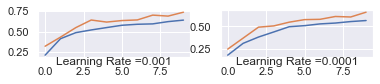

In [120]:
learning_rates = [1e-3,1e-4] 
for i in range(len(learning_rates)):
    # determine the plot number
    plot_no = 420 + (i+1)
    plt.subplot(plot_no)
    # fit model and plot learning curves for a learning rate
    NN_model(train_generator,test_generator, learning_rates[i])

# show learning curves
plt.show()

In [121]:
def NNmodel_builder():
    model = Sequential()

    model.add(InputLayer(input_shape=(configuration['img_height'],configuration['img_width'],3)))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(configuration['drop_out_rate']))

    model.add(Dense(40, activation='relu'))

    model.add(Dense(25, activation='relu'))
    
    model.add(Flatten())

    model.add(Dense(configuration['num_classes'], activation='softmax'))

    model.summary()
    # compile model
    model.compile(loss='categorical_crossentropy', optimizer= tf.keras.optimizers.Adam(learning_rate=1e-3), metrics=['acc'])
    
    return model

In [122]:
NN1_model = NNmodel_builder()
history = NN1_model.fit(train_generator, validation_data = test_generator, epochs = configuration['epochs'], validation_steps=ntest // configuration['batch_size'], steps_per_epoch=ntrain // configuration['batch_size'], callbacks = [
                configuration['early_stopping'],
                configuration['reduce_lr_on_platue']
                ]
    )

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 150, 150, 128)     512       
_________________________________________________________________
dense_41 (Dense)             (None, 150, 150, 100)     12900     
_________________________________________________________________
dropout_8 (Dropout)          (None, 150, 150, 100)     0         
_________________________________________________________________
dense_42 (Dense)             (None, 150, 150, 40)      4040      
_________________________________________________________________
dense_43 (Dense)             (None, 150, 150, 25)      1025      
_________________________________________________________________
flatten_8 (Flatten)          (None, 562500)            0         
_________________________________________________________________
dense_44 (Dense)             (None, 12)               

In [123]:
nn1_score = NN1_model.evaluate(test_generator, verbose=1)
print("Test Score:", nn1_score[0])
print("Test Accuracy:", nn1_score[1]*100)
results.append(nn1_score[1])
names.append('Neural Network')

Test Score: 0.626157820224762
Test Accuracy: 81.13207817077637


### CNN Model

In [125]:
def CNN_Model():
    model = Sequential()
    model.add(Conv2D(32, kernel_size = (3, 3), activation='relu', input_shape=(150, 150, 3)))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization())
    model.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization())
    model.add(Conv2D(96, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization())
    model.add(Conv2D(96, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization())
    model.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization())
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.2))
    model.add(Dense(128, activation='relu'))
    #model.add(Dropout(0.3))
    model.add(Dense(12, activation = 'softmax'))
    
    # compile model
    model.compile(loss='categorical_crossentropy', optimizer= tf.keras.optimizers.Adam(), metrics=['acc'])
    return model

In [127]:
CNN1_model = CNN_Model()
history = CNN1_model.fit(train_generator, validation_data = test_generator, epochs = configuration['epochs'], validation_steps=ntest // configuration['batch_size'], steps_per_epoch=ntrain // configuration['batch_size'], callbacks = [
                configuration['early_stopping'],
                configuration['reduce_lr_on_platue'],
                configuration['checkpoints'],
                configuration['checkpoints_full']
                ]
    )

Epoch 1/50
95/95 [==============================] - ETA: 0s - batch: 47.0000 - size: 39.7158 - loss: 1.8154 - acc: 0.3917
Epoch 00001: val_acc did not improve from 0.26630

Epoch 00001: saving model to ..\weights.last_auto4.hdf5
95/95 [==============================] - 86s 909ms/step - batch: 47.0000 - size: 39.7158 - loss: 1.8154 - acc: 0.3917 - val_loss: 5.1376 - val_acc: 0.1239
Epoch 2/50
95/95 [==============================] - ETA: 0s - batch: 47.0000 - size: 39.7158 - loss: 1.3367 - acc: 0.5378
Epoch 00002: val_acc did not improve from 0.26630

Epoch 00002: saving model to ..\weights.last_auto4.hdf5
95/95 [==============================] - 88s 921ms/step - batch: 47.0000 - size: 39.7158 - loss: 1.3367 - acc: 0.5378 - val_loss: 6.7816 - val_acc: 0.1239
Epoch 3/50
95/95 [==============================] - ETA: 0s - batch: 47.0000 - size: 39.7158 - loss: 1.1039 - acc: 0.6191
Epoch 00003: val_acc did not improve from 0.26630

Epoch 00003: saving model to ..\weights.last_auto4.hdf5
95/

Epoch 21/50
95/95 [==============================] - ETA: 0s - batch: 47.0000 - size: 39.7158 - loss: 0.3054 - acc: 0.8900
Epoch 00021: val_acc improved from 0.92391 to 0.92717, saving model to ..\weights.best_21-0.93.hdf5

Epoch 00021: saving model to ..\weights.last_auto4.hdf5
95/95 [==============================] - 775s 8s/step - batch: 47.0000 - size: 39.7158 - loss: 0.3054 - acc: 0.8900 - val_loss: 0.2120 - val_acc: 0.9272
Epoch 22/50
95/95 [==============================] - ETA: 0s - batch: 47.0000 - size: 40.0000 - loss: 0.3218 - acc: 0.8850
Epoch 00022: val_acc did not improve from 0.92717

Epoch 00022: saving model to ..\weights.last_auto4.hdf5
95/95 [==============================] - 82s 866ms/step - batch: 47.0000 - size: 40.0000 - loss: 0.3218 - acc: 0.8850 - val_loss: 0.2293 - val_acc: 0.9120
Epoch 23/50
95/95 [==============================] - ETA: 0s - batch: 47.0000 - size: 39.7158 - loss: 0.2959 - acc: 0.8900
Epoch 00023: val_acc did not improve from 0.92717

Epoch 00

In [128]:
cnn1_score = CNN1_model.evaluate(test_generator, verbose=1)
print("Test Score:", cnn1_score[0])
print("Test Accuracy:", cnn1_score[1]*100)
results.append(cnn1_score[1])
names.append('CNN')

Test Score: 0.1764578027650714
Test Accuracy: 93.71069073677063


### Comparison of all the models trained

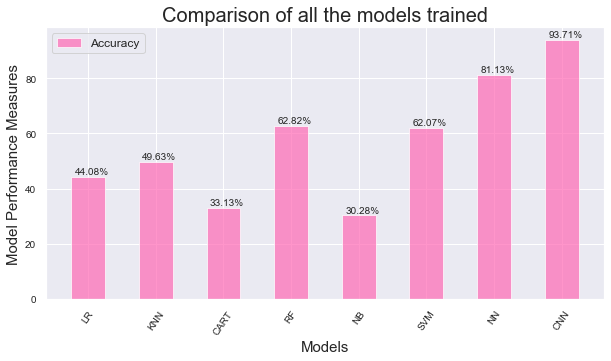

In [153]:
#Creating a graph of multiple bars
ig, ax = plt.subplots(figsize=(10,5))
n_groups = 8
index = np.arange(n_groups)
# index = label
bar_width = 0.5
opacity = .7
acc_bar = ax.bar(index, results, bar_width, alpha=opacity, color='Hotpink', label='Accuracy')
# mis_bar = ax.bar(index + bar_width, mis_arr, bar_width, alpha=opacity, color='orangered', label='Misclassification')

ax.set_xlabel('Models',  fontsize = 15)
ax.set_ylabel('Model Performance Measures',  fontsize = 15)
ax.set_title('Comparison of all the models trained',  fontsize = 20)
ax.set_xticks(index + bar_width - 0.5)
ax.set_xticklabels(names, fontsize = 14)
ax.tick_params(labelsize=10)

for index,data in enumerate(results):
    data = round(data, 2)
    plt.text(x=index - 0.2 , y = data+1 , s=f"{data}%" , fontdict=dict(fontsize=10))
    
#Changing alignment of labels in x axis
for c in ax.get_xticklabels():
    c.set_rotation(55)
    
ax.legend(fontsize = 12, loc = 'best')

plt.show()

- Among the Supervised Learning model Random Forest Model & Support Vector Machine had the best performance as the accuarcy is above 50%.
- For prediction purpose, we will be selecting CNN has the best model for classification as it has the highest accuracy i.e. of 93.71%.

### Pickling the best model and using this model to make predictions.

In [230]:
CNN1_model.save("CNN_Model_P1.h5")

In [231]:
best_model = load_model('CNN_Model_P1.h5')

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [241]:
#Reading the jpg image from Prediction Folder
pred_f = 'Prediction'

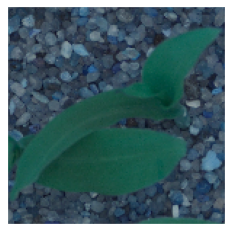

In [242]:
#Displaying the prediction image

ff = [] # labels

for image in os.listdir(pred_f):
    input_img = cv2.imread(os.path.join(pred_f, image), cv2.IMREAD_COLOR)
    input_img = cv2.resize(input_img,(150,150), interpolation=cv2.INTER_CUBIC)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(input_img, cmap=plt.cm.binary)
    ff.append(input_img)

ff = np.array(ff)

In [245]:
predict_prob=best_model.predict(ff)

In [246]:
predict_classes=np.argmax(predict_prob,axis=1)
predict_classes

array([7], dtype=int64)

In [247]:
categories[predict_classes[0]]

'Maize'

CNN Model predicted the correct plant seedling species of the prediction image i.e. Maize.

# Part 2
  <b> Why CNN out performs neural networks which in turn out perform supervised learning models when it comes to image classification?</b>

- The Convolutional Neural Network are great for capturing information such surrounding pixels aroung the image as well as reducing the complexity of the model which in turn helps in faster training, needing fewer samples, reducing the chance of overfitting.
- A CNN, in specific, has one or more convolution layer. A convolution layer receives its input from multiple units from the previous layer. Therefore, the input units share their weights.
- Their convolution units and pooling units are beneficial as well.
- They reduce the number of units in the network (since they are many-to-one mappings). This means, there are fewer parameters to learn which reduces the chance of overfitting as the model would be less complex than a fully connected network.
- They consider the context/shared information in the small neighborhoods. This future is very important in many applications such as image, video, text, and speech processing/mining as the neighboring inputs (eg pixels, frames, words, etc) usually carry related information.
- Whereas, with Neural Network or Artificial Neural Network, image classification problems become difficult because 2 dimensional images need to be converted to 1 dimensional vectors. This increases the number of trainable parameters exponentially. Increasing trainable parameters takes storage and processing capability.
- Also, for ANN, concrete data points must be provided.
- Supervised Learning Algorithms parse data, learns from it, and use those learnings to discover meaningful patterns of interest. Whereas a Neural Network consists of an assortment of algorithms used in Machine Learning for data modelling using graphs of neurons.
- While a Supervised Learning model makes decisions according to what it has learned from the data, a Neural Network arranges algorithms in a fashion that it can make accurate decisions by itself. Thus, although Supervised Learning models can learn from data, in the initial stages, they may require some human intervention.
- Neural networks do not require human intervention as the nested layers within pass the data through hierarchies of various concepts, which eventually makes them capable of learning through their own errors.
- In short, Supervised Learning Algorithm is fed with data and learns from it. With time, the Supervised Learning model becomes more mature and trained as it continually learns from the data. On the contrary, the structure of a Neural Network is quite complicated. In it, the data passes through several layers of interconnected nodes, wherein each node classifies the characteristics and information of the previous layer before passing the results on to other nodes in subsequent layers. 

# Part 3
 - <b>Context:</b> A brand research company wants to understand which cars or car manufacturers are popular in a certain area of the city or locality. Company has a team which takes pictures of the cars randomly through the day. Using this the company wants to set up an automation which can classify the make of the car once the picture has been given as an input.
 - <b>Objective: </b> Building the image dataset to be used by the AI team to build an image classifier data. Importing and displaying the images in against their labels.

In [154]:
car_img_path = 'Cars Images'             #Downloaded folder store in this path

In [155]:
#Displaying all the images in the folder

non_label = []
for image in os.listdir(car_img_path):
    input_img = cv2.imread(os.path.join(car_img_path, image))
    non_label.append(input_img)

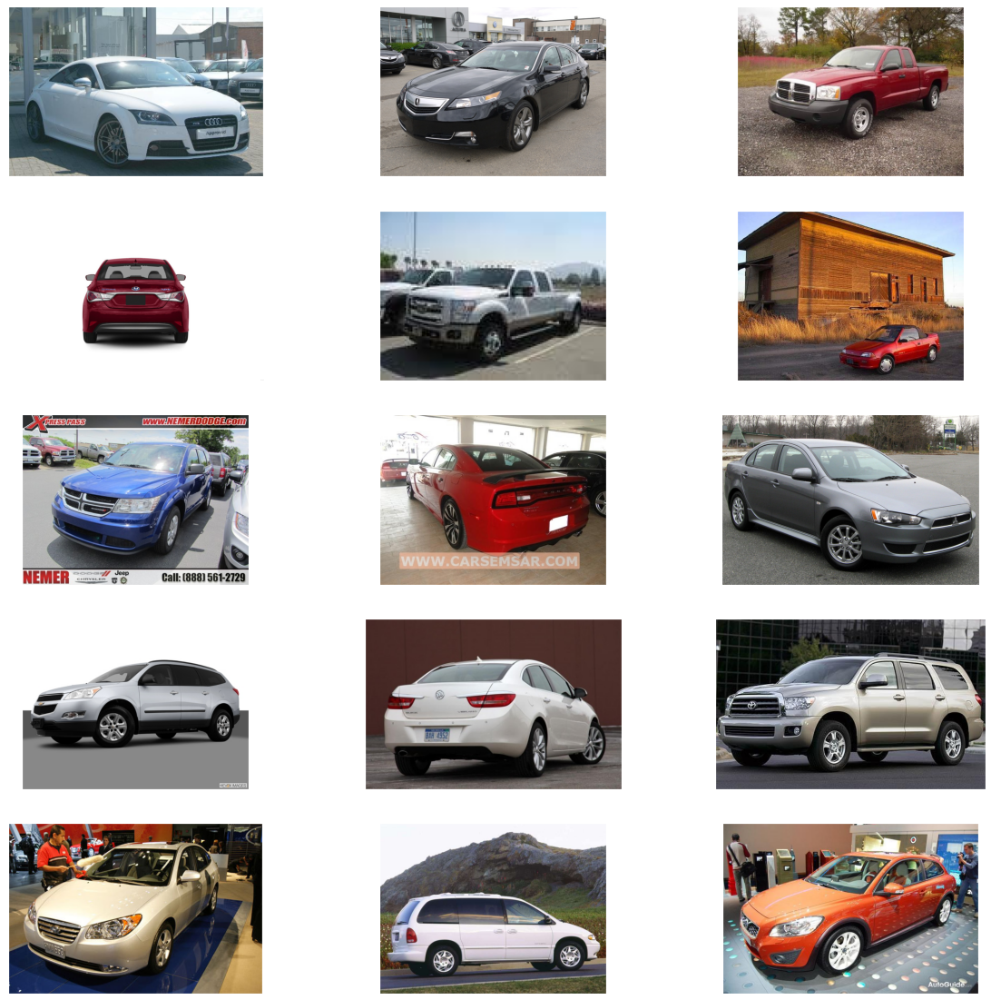

In [156]:
plt.figure(figsize=(20,20))
p = 1
for i in non_label:
    i = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
    plt.subplot(5,3,p)
    plt.imshow(i)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    p = p+1

In [157]:
# Getting the image file path and storing them in a new list.

gg = []
for i in os.listdir(car_img_path):
    gg.append('Cars Images/{}'.format(i))

In [162]:
from IPython.display import display, Image
chk = pixt.annotate(gg,
            options=['Audi','Acura','Dodge','Hyundai','Ford', 'Geo Motors','Mitsubishi','Chevrolet','Toyota','Volvo'],
            display_fn = lambda gg: display(Image(gg))
                      )

HTML(value='0 of 15 Examples annotated, Current Position: 0 ')

Output()

Annotation done.


In [163]:
chk

,example,changed,label
0,Cars Images/00001.jpg,True,Audi
1,Cars Images/00002.jpg,True,Acura
2,Cars Images/00003.jpg,True,Dodge
3,Cars Images/00004.jpg,True,Hyundai
4,Cars Images/00005.jpg,True,Ford
5,Cars Images/00006.jpg,True,Geo Motors
6,Cars Images/00007.jpg,True,Dodge
7,Cars Images/00008.jpg,True,Dodge
8,Cars Images/00009.jpg,True,Mitsubishi
9,Cars Images/00010.jpg,True,Chevrolet


In [258]:
path = '../'
main_folder = 'Automobile'
if not os.path.exists(main_folder):
    os.mkdir(main_folder)
else:
    print("Folder already exists")

Folder already exists


In [259]:
label_list = []
folder_flag = False
for l in chk['label'].unique():
    label_list.append(l)
    
    subfolder = main_folder + "/" + str(l)
    
    if not os.path.exists(subfolder):
        os.mkdir(subfolder) 
    else:
        folder_flag = True
        
    for img_path in chk.example[chk.label == l]:
        nm_split = img_path.split("/")
        image_name = nm_split[1]
        filepath =  subfolder + "/" + image_name
        save_img = cv2.imread(img_path)
        cv2.imwrite(filepath, save_img)

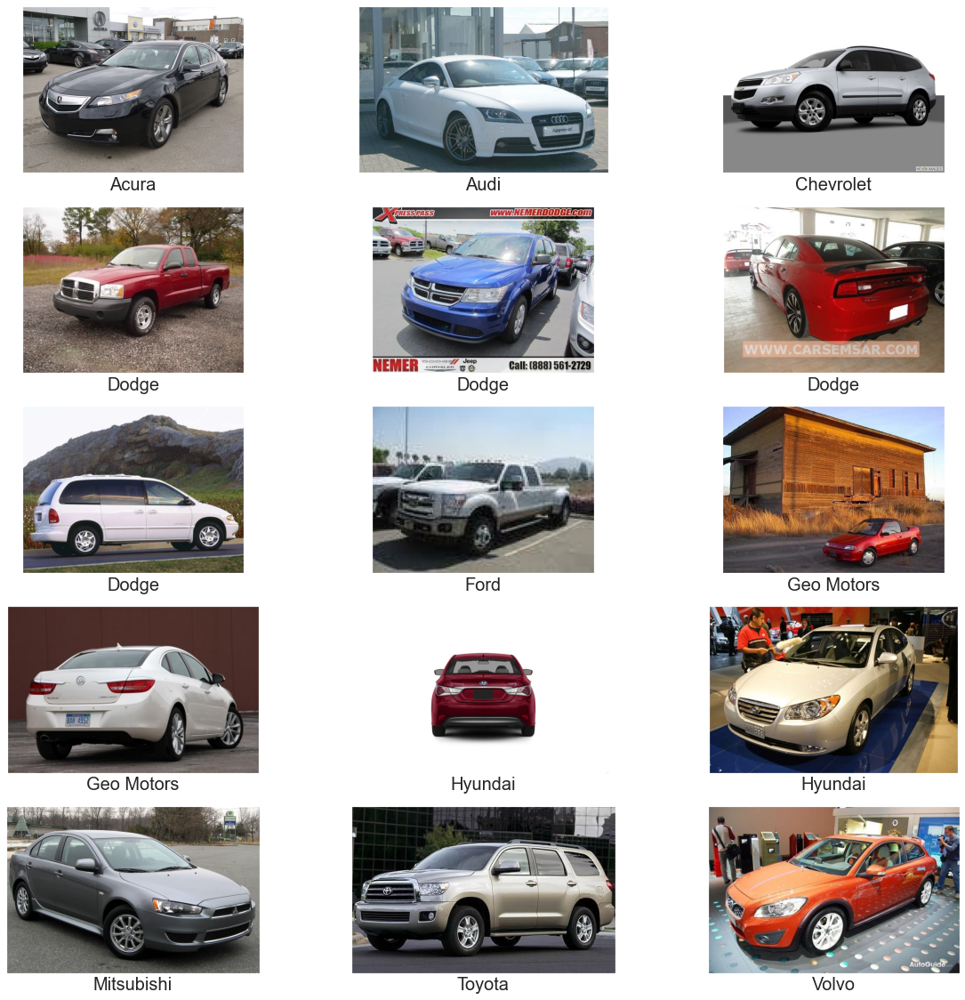

In [260]:
sorted_data_path = 'Automobile'
plt.figure(figsize=(20,20))
font_style = {'size':20}
h = 1
for sf in os.listdir(sorted_data_path):
    sb_path = os.path.join(sorted_data_path,sf)   #Getting sub-folder path
    for ig in os.listdir(sb_path):
        i_path = os.path.join(sb_path,ig)         #Getting image file path
        read_img = cv2.imread(i_path)          
        
        #Reading the image in RGB
        read_img = cv2.cvtColor(read_img, cv2.COLOR_BGR2RGB)
        
        #Plotting them in a grid with their corrresponding labels
        plt.subplot(5,3,h)
        plt.imshow(read_img)
        plt.xlabel(sf, fontdict = font_style)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        h = h + 1

- <b>Challenges faced during this task:</b>
 
     - First of all, the images were needed to be scanned to get their labels.
     - After which I could label them using the open source Pigeon XT tool.
     - Also, it took a while to understand the working of the above mentioned tools and in the process got to recitify many unknown error.
     - For this tool to work successfully, had to install many packages.
     - After they were finally labelled using the tool, the dataset needed to be in a format for usage in Image Classification.
     - This required OS package from Python to create main folder and sub folders of labels and images inside it.

# Part 4
 - <b>Context:</b> University X is currently undergoing some research involving understanding the characteristics of flowers. They already have have invested on curating sample images. They require an automation which can create a classifier capable of determining a flower’s species from a photo.
 - <b>Objective: </b> Company’s management requires an automation which can create a classifier capable of determining a flower’s species from a photo.

### Importing the data. Analyzing the dimensions of the data & preprocessing the data

In [69]:
X4, Y4 = oxflower17.load_data(one_hot=False)

In [57]:
np.savez_compressed('ox7', X4=X4, Y4=Y4)

In [58]:
data = np.load('ox7.npz')
print(data['X4'].shape, data['Y4'].shape)

(1360, 227, 227, 3) (1360, 17)


In [265]:
# Data visualisation

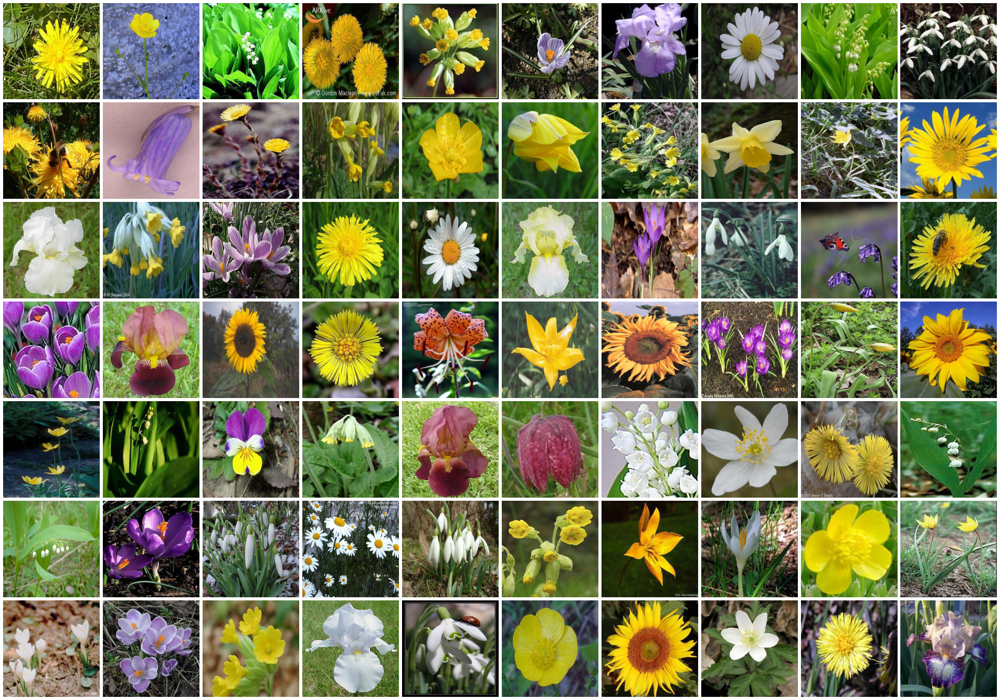

In [268]:
fig = plt.figure(figsize=(40,40))
grid = ImageGrid(fig, 111, 
                     nrows_ncols=(7,10),  
                     axes_pad=0.1, 
                     share_all=True,
                     )
for i in range(7*10):
    ax = grid[i]
    ax.imshow(X4[i], cmap='gray')
    ax.axis('off')


In [270]:
train_img = 'jpg_sample'
species = {}
for class_name in os.listdir(train_img):
# #     print(class_name)
    if class_name == '0':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Daffodil"
        os.rename(source, dest)
        class_name = "Daffodil"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '1':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Snowdrop"
        os.rename(source, dest)
        class_name = "Snowdrop"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '2':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Lily of the valley"
        os.rename(source, dest)
        class_name = "Lily of the valley"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '3':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Common Bluebell"
        os.rename(source, dest)
        class_name = "Common Bluebell"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '4':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Autumn Crocus"
        os.rename(source, dest)
        class_name = "Autumn Crocus"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '5':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Iris Germanica"
        os.rename(source, dest)
        class_name = "Iris Germanica"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '6':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Caroline Lily"
        os.rename(source, dest)
        class_name = "Caroline Lily"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '7':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Crocus Flavus"
        os.rename(source, dest)
        class_name = "Crocus Flavus"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '8':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Fritillaria Cirrhosa"
        os.rename(source, dest)
        class_name = "Fritillaria Cirrhosa"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '9':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Sunflower"
        os.rename(source, dest)
        class_name = "Sunflower"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '10':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Common Daisy"
        os.rename(source, dest)
        class_name = "Common Daisy"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '11':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Coltsfoot"
        os.rename(source, dest)
        class_name = "Coltsfoot"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '12':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Common Dandelion"
        os.rename(source, dest)
        class_name = "Common Dandelion"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '13':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Cowslip"
        os.rename(source, dest)
        class_name = "Cowslip"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '14':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Meadow Buttercup"
        os.rename(source, dest)
        class_name = "Meadow Buttercup"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '15':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Wood Anemone"
        os.rename(source, dest)
        class_name = "Wood Anemone"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))
    elif class_name == '16':
        source = train_img + "/" + class_name
        dest = train_img + "/" + "Pansy"
        os.rename(source, dest)
        class_name = "Pansy"
        species[class_name] = len(os.listdir(os.path.join(train_img, class_name)))


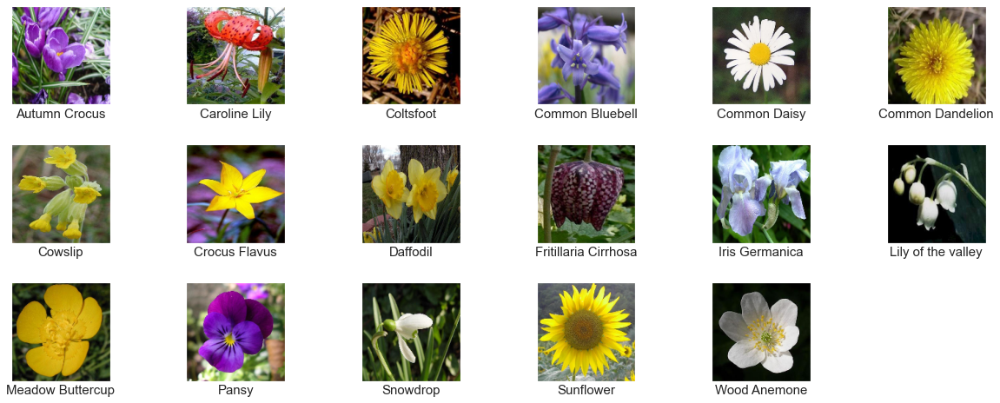

In [274]:
plt.figure(figsize=(20,20))
font_style = {'size':15}
plt.subplots_adjust(left=0.1,
                    bottom=0.6, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
d = 1
spec_ls = []
counter = 0
while counter < 17:
    for sf in os.listdir(train_img):
        sb_path = os.path.join(train_img,sf)   #Getting sub-folder path
        if sb_path not in spec_ls:
            for ig in os.listdir(sb_path):
                i_path = os.path.join(sb_path,ig)         #Getting image file path
                read_img = cv2.imread(i_path)          
                read_img = cv2.resize(read_img,(150,150))
                
                #Reading the image in RGB
                read_img = cv2.cvtColor(read_img, cv2.COLOR_BGR2RGB)
                
                #Plotting them in a grid with their corrresponding labels
                plt.subplot(3,6,d)
                plt.imshow(read_img)
                plt.xlabel(sf, fontdict = font_style)
                plt.xticks([])
                plt.yticks([])
                plt.grid(False)
                d = d + 1
                counter = counter + 1
                spec_ls.append(sb_path)
                break


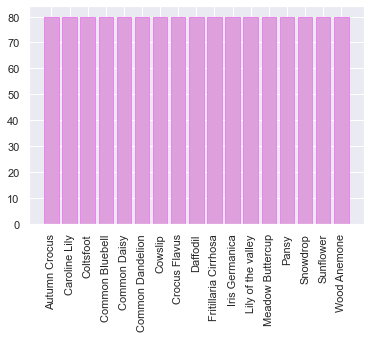

In [275]:
fig, ax = plt.subplots()

ax.bar(species.keys(), species.values(), color = 'plum', edgecolor = 'violet')
plt.xticks(rotation=90)

plt.show()

- As displayed above, there are 17 species of the flowers samples provided for training.
- These are the categories of the flower such as Daffodil, Snowdrop, Common Daisy, Common Bluebell, Autumn Crocus, Iris Germanica, Caroline Lily, Crocus Flavus, Fritillaria Cirrhosa, Sunflower, Lily of the Valley, Coltsfoot, Common Dandelion, Cowslip, Meadow Buttercup, Wood Anemone & Pansy.
- All of these flower categories have 80 images samples each.

In [276]:
dir = 'jpg_sample'

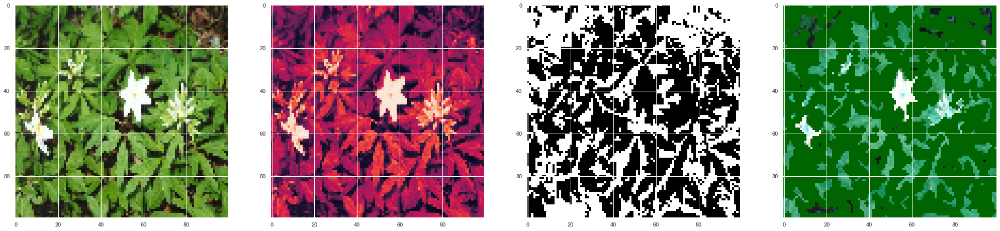

In [278]:
fl_data = []

plt.figure(figsize=(35,35))

for category in species.keys():
    path = os.path.join(dir,category)
#     label = category
    
    for img in os.listdir(path):
        label = category
#         print(label)
        input_img = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
        input_img = cv2.resize(input_img,(100,100), interpolation=cv2.INTER_CUBIC)
        
#  # convert to RGB
        rgb_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2RGB)
        plt.subplot(1,4,1)
        plt.imshow(rgb_img)
    # convert to grayscale
        gray_img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2GRAY)
        plt.subplot(1,4,2)
        plt.imshow(gray_img)
    # create a binary thresholded image
        _, binary = cv2.threshold(gray_img, 100, 100, cv2.THRESH_BINARY_INV)
        plt.subplot(1,4,3)
        plt.imshow(binary, cmap="gray")
        
     # find the contours from the thresholded image
        contours, hierarchy = cv2.findContours(binary, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
    # draw all contours
        final_img = cv2.drawContours(input_img, contours, -1, (0, 100, 0), 2)
        plt.subplot(1,4,4)
        plt.imshow(final_img)
        

        fl_data.append([final_img,label])


In [279]:
lenofimage = len(fl_data)
lenofimage

1360

In [280]:
features = []
labels = []

In [281]:
for feature,label in fl_data:
    features.append(feature)
    labels.append(label)
    
features = np.array(features).reshape(len(fl_data),-1)

In [282]:
labels = np.array(labels)

In [283]:
features = features/255

In [284]:
print('Max' , features.max())
print('Min' , features.min())

Max 1.0
Min 0.0


In [285]:
features.shape

(1360, 30000)

In [286]:
labels.shape

(1360,)

### Training, tuning and testing AIML image classifier model using:
 - Supervised learning algorithms for training
 - Neural networks for training
 - CNN for training
 - Transferred learning models for training

In [287]:
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.30)

In [288]:

# no.of.trees for Random Forests
num_trees = 100
# create all the machine learning models
models = []
models.append(('LR', LogisticRegression(random_state=9)))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier(random_state=9)))
models.append(('RF', RandomForestClassifier(n_estimators=num_trees, random_state=9)))
models.append(('NB', GaussianNB()))
models.append(('SVM', SVC(random_state=9)))

In [289]:
# variables to hold the results and names
results = []
names = []
scoring = "accuracy"

In [290]:
%%time
# filter all the warnings
import warnings
warnings.filterwarnings('ignore')
X_train, y_train
# 10-fold cross validation
for name, model in models:
    kfold = KFold(n_splits=5, random_state=None)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring=scoring)
    results.append(cv_results)
    names.append(name)
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)


LR: 0.364530 (0.025887)
LDA: 0.125032 (0.020481)
KNN: 0.258435 (0.017809)
CART: 0.249975 (0.021883)
RF: 0.400287 (0.033477)
NB: 0.315200 (0.050324)
SVM: 0.349848 (0.026409)
Wall time: 5min 3s


In [291]:
results

[array([0.37172775, 0.32460733, 0.35789474, 0.40526316, 0.36315789]),
 array([0.13089005, 0.08900524, 0.12631579, 0.15263158, 0.12631579]),
 array([0.2617801 , 0.22513089, 0.27368421, 0.25789474, 0.27368421]),
 array([0.28272251, 0.2408377 , 0.23157895, 0.22631579, 0.26842105]),
 array([0.38743455, 0.34031414, 0.42105263, 0.43157895, 0.42105263]),
 array([0.29842932, 0.2617801 , 0.35789474, 0.26842105, 0.38947368]),
 array([0.31937173, 0.32460733, 0.34736842, 0.36842105, 0.38947368])]

### Neural Network Model

In [292]:
train_dir = '17flowers/jpg/'
test_dir = 'Test_part4'

In [293]:
train_1= ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'0'))]  
train_2 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'1'))]  
train_3 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'2'))]  
train_4 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'3'))] 
train_5 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'4'))]  
train_6 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'5'))] 
train_7 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'6'))] 
train_8 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'7'))] 
train_9 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'8'))]  
train_10 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'9'))]  
train_11 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'10'))]  
train_12 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'11'))] 
train_13 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'12'))] 
train_14 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'13'))]
train_15 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'14'))] 
train_16 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'15'))] 
train_17 = ['../17flowers/jpg/{}'.format(i) for i in os.listdir(os.path.join(train_dir,'16'))]

test_imgs = ['../Test_part4/{}'.format(i) for i in os.listdir(test_dir)] #get test images

train_imgs = train_1 + train_2 + train_3 + train_4 + train_5 + train_6 + train_7 + train_8 + train_9 + train_10 + train_11+ train_12 + train_13 + train_14 + train_15 + train_16
random.shuffle(train_imgs)

# train_imgs
# test_imgs

In [294]:
species1 = []
for i in range (0,17):
    species1.append(str(i))

In [295]:
nrows = 150
ncolumns = 150
channels = 3 

In [296]:
def read_and_process_image(list_of_images):
    """
    Returns two arrays: 
        X is an array of resized images
        y is an array of labels
    """
    X = [] # images
    y = [] # labels
#     print(list_of_images)

    for category in species1:
        path = os.path.join(train_dir,category)
    
        
        for image in os.listdir(path):
            label =  species1.index(category)
            y.append(label)
            X.append(cv2.resize(cv2.imread(os.path.join(path, image)), (nrows,ncolumns), interpolation=cv2.INTER_CUBIC))
            
    return X, y

In [297]:
X, y = read_and_process_image(train_imgs)

In [298]:
#Convert list to numpy array
X = np.array(X)
y = np.array(y)

In [299]:
print("Shape of train images is:", X.shape)
print("Shape of labels is:", y.shape)

Shape of train images is: (1360, 150, 150, 3)
Shape of labels is: (1360,)


In [300]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=2)

print("Shape of train images is:", X_train.shape)
print("Shape of validation images is:", X_test.shape)
print("Shape of labels is:", y_train.shape)
print("Shape of labels is:", y_test.shape)

Shape of train images is: (1088, 150, 150, 3)
Shape of validation images is: (272, 150, 150, 3)
Shape of labels is: (1088,)
Shape of labels is: (272,)


In [301]:
# convert the labels from integers to vectors
y_train = to_categorical(y_train, num_classes=17)
y_test = to_categorical(y_test, num_classes=17)
print(y_train.shape)
print(y_test.shape)

(1088, 17)
(272, 17)


In [302]:
#get the length of the train and validation data
ntrain = len(X_train)
ntest = len(X_test)

print(ntrain)
print(ntest)

1088
272


In [303]:
train_datagen = ImageDataGenerator(rescale=1./255,   #Scale the image between 0 and 1
                                    rotation_range=40,
                                    width_shift_range=0.2,
                                    height_shift_range=0.2,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,)

test_datagen = ImageDataGenerator(rescale=1./255)  #We do not augment validation data. we only perform rescale

In [304]:
train_generator = train_datagen.flow(X_train, y_train, batch_size=20)
test_generator = test_datagen.flow(X_test, y_test, batch_size=20)

In [13]:
configuration = {
    
    'validation_split': 0.25,
    'train_batch_size': 100,
    'test_batch_size': 10,
    'batch_size' :10,
    'img_height': 150,
    'img_width': 150,
    'num_classes' : 17,
    
    'drop_out_rate': 0.5,
    'epochs': 50,
    'checkpoints' : ModelCheckpoint('../weis.best_{epoch:02d}-{val_acc:.2f}.hdf5',
                                    monitor='val_acc', 
                                    verbose=1, 
                                    save_best_only=True, 
                                    mode='max'),

    'checkpoints_full' : ModelCheckpoint('../weis.last1_auto4.hdf5', 
                                         monitor='val_acc', 
                                         verbose=1, 
                                         save_best_only=False,
                                         mode='max'),
    'early_stopping': tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                    mode='auto',
                                    verbose=1,
                                    patience=5),
    'reduce_lr_on_platue': tf.keras.callbacks.ReduceLROnPlateau(monitor='val_acc', 
                                    patience=3,
                                    verbose=1,
                                    factor=.4, 
                                    min_lr=0.0000001),

    'accuracy': ['accuracy'],
}

In [306]:
def NN_model_p4(lrate):
    nnmodel = Sequential()

    nnmodel.add(Dense(128,input_shape=(configuration['img_height'],configuration['img_width'],3), activation = 'relu'))
    
    nnmodel.add(Dense(128, activation = 'relu'))
    nnmodel.add(Dropout(0.5))
    nnmodel.add(Dense(128, activation = 'relu'))
    nnmodel.add(Flatten())
    nnmodel.add(Dense(17, activation = 'softmax', kernel_regularizer = regularizers.L2(0.01)))
    
    opt = optimizers.Adam(lr=lrate)
    nnmodel.compile(loss='categorical_crossentropy',
              optimizer=opt, # learning rate should be small so previously learned weights don't vanish
              metrics=['acc'])
    history = nnmodel.fit(train_generator, validation_data = test_generator, 
                    epochs =  configuration['epochs'],
                    callbacks = [
                configuration['early_stopping'],
                configuration['reduce_lr_on_platue'],
                configuration['checkpoints'],
                configuration['checkpoints_full']
                ]
    )

    return nnmodel

In [307]:
nnmodel = NN_model_p4(3e-5)  

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.2917 - acc: 0.1002
Epoch 00001: val_acc improved from -inf to 0.15074, saving model to ..\weis.best_01-0.15.hdf5

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 122s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 3.2917 - acc: 0.1002 - val_loss: 2.8732 - val_acc: 0.1507
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.7986 - acc: 0.2013
Epoch 00002: val_acc improved from 0.15074 to 0.26838, saving model to ..\weis.best_02-0.27.hdf5

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 113s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 2.7986 - acc: 0.2013 - val_loss: 2.6010 - val_acc: 0.2684
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.6778 - acc: 0.2417
Epoch 00003: val_acc did no

55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.7900 - acc: 0.5138
Epoch 00021: val_acc improved from 0.48897 to 0.50368, saving model to ..\weis.best_21-0.50.hdf5

Epoch 00021: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 124s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.7900 - acc: 0.5138 - val_loss: 1.7975 - val_acc: 0.5037
Epoch 22/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.7873 - acc: 0.5368
Epoch 00022: val_acc did not improve from 0.50368

Epoch 00022: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 123s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.7873 - acc: 0.5368 - val_loss: 1.7978 - val_acc: 0.5000
Epoch 23/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.7598 - acc: 0.5303
Epoch 00023: val_acc did not improve from 0.50368

Epoch 00023: saving model to 

55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.6482 - acc: 0.5809
Epoch 00041: ReduceLROnPlateau reducing learning rate to 1e-07.

Epoch 00041: val_acc did not improve from 0.50735

Epoch 00041: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 126s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.6482 - acc: 0.5809 - val_loss: 1.7452 - val_acc: 0.4890
Epoch 00041: early stopping


In [308]:
score = nnmodel.evaluate(test_generator, verbose=1)
print("Test Score:", score[0])
print("Test Accuracy:", score[1]*100)

Test Score: 1.7741726551737105
Test Accuracy: 48.89705777168274


In [309]:
nnmodel = NN_model_p4(4.57789738255E-4)

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 10.8709 - acc: 0.0965
Epoch 00001: val_acc did not improve from 0.50735

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 129s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 10.8709 - acc: 0.0965 - val_loss: 3.9280 - val_acc: 0.2390
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.3329 - acc: 0.2362
Epoch 00002: val_acc did not improve from 0.50735

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 130s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 3.3329 - acc: 0.2362 - val_loss: 2.9107 - val_acc: 0.3235
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.8065 - acc: 0.3382
Epoch 00003: val_acc did not improve from 0.50735

Epoch 00003: saving model to ..\weis.last1_auto4.hdf5
55/55 [====

Epoch 22/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.8429 - acc: 0.5625
Epoch 00022: val_acc did not improve from 0.56618

Epoch 00022: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 127s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.8429 - acc: 0.5625 - val_loss: 1.9677 - val_acc: 0.4632
Epoch 23/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.8475 - acc: 0.5524
Epoch 00023: val_acc did not improve from 0.56618

Epoch 00023: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 127s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.8475 - acc: 0.5524 - val_loss: 1.8030 - val_acc: 0.5515
Epoch 24/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.8196 - acc: 0.5450
Epoch 00024: ReduceLROnPlateau reducing learning rate to 7.32463609892875e-05.

Epoch 00024: val_acc did not improv

55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.4358 - acc: 0.6259
Epoch 00042: ReduceLROnPlateau reducing learning rate to 3.000170863742824e-07.

Epoch 00042: val_acc did not improve from 0.56618

Epoch 00042: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 126s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.4358 - acc: 0.6259 - val_loss: 1.5541 - val_acc: 0.5478
Epoch 43/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.4417 - acc: 0.6526
Epoch 00043: val_acc did not improve from 0.56618

Epoch 00043: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 126s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.4417 - acc: 0.6526 - val_loss: 1.5504 - val_acc: 0.5478
Epoch 00043: early stopping


In [310]:
score = nnmodel.evaluate(test_generator, verbose=1)
print("Test Score:", score[0])
print("Test Accuracy:", score[1]*100)

Test Score: 1.5447078091757638
Test Accuracy: 54.77941036224365


In [311]:
nnmodel = NN_model_p4(5.68978973825E-4)  

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 16.1544 - acc: 0.0597
Epoch 00001: val_acc did not improve from 0.56618

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 130s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 16.1544 - acc: 0.0597 - val_loss: 15.7734 - val_acc: 0.0515
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 6.7658 - acc: 0.1342
Epoch 00002: val_acc did not improve from 0.56618

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 132s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 6.7658 - acc: 0.1342 - val_loss: 3.7686 - val_acc: 0.1581
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.1848 - acc: 0.2849
Epoch 00003: val_acc did not improve from 0.56618

Epoch 00003: saving model to ..\weis.last1_auto4.hdf5
55/55 [===

55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.7320 - acc: 0.5515
Epoch 00022: val_acc did not improve from 0.56618

Epoch 00022: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 148s 3s/step - batch: 27.0000 - size: 19.7818 - loss: 1.7320 - acc: 0.5515 - val_loss: 1.6992 - val_acc: 0.5662
Epoch 23/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.6943 - acc: 0.5689
Epoch 00023: val_acc improved from 0.56618 to 0.58456, saving model to ..\weis.best_23-0.58.hdf5

Epoch 00023: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 149s 3s/step - batch: 27.0000 - size: 19.7818 - loss: 1.6943 - acc: 0.5689 - val_loss: 1.6906 - val_acc: 0.5846
Epoch 24/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.6575 - acc: 0.5763
Epoch 00024: val_acc did not improve from 0.58456

Epoch 00024: saving model to 

55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.4689 - acc: 0.6305
Epoch 00042: val_acc did not improve from 0.58456

Epoch 00042: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 129s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.4689 - acc: 0.6305 - val_loss: 1.5702 - val_acc: 0.5551
Epoch 43/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.4246 - acc: 0.6461
Epoch 00043: val_acc did not improve from 0.58456

Epoch 00043: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 129s 2s/step - batch: 27.0000 - size: 19.7818 - loss: 1.4246 - acc: 0.6461 - val_loss: 1.5794 - val_acc: 0.5551
Epoch 44/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.4450 - acc: 0.6471
Epoch 00044: ReduceLROnPlateau reducing learning rate to 1.491544139753387e-07.

Epoch 00044: val_acc did not improve from 0.58

In [313]:
NN_Final_score = nnmodel.evaluate(test_generator, verbose=1)
print("Test Score:", NN_Final_score[0])
print("Test Accuracy:", NN_Final_score[1]*100)
results.append(NN_Final_score[1]*100)

Test Score: 1.5771254897117615
Test Accuracy: 55.514705181121826


### CNN Model

In [315]:
def CNN_Model_p4(lrate):
    cnn_model = Sequential()
    cnn_model.add(Conv2D(32, kernel_size = (3, 3), activation='relu', input_shape=(configuration['img_height'],configuration['img_width'],3)))
    cnn_model.add(MaxPooling2D(pool_size=(2,2)))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
    cnn_model.add(MaxPooling2D(pool_size=(2,2)))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Conv2D(96, kernel_size=(3,3), activation='relu'))
    cnn_model.add(MaxPooling2D(pool_size=(2,2)))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Conv2D(96, kernel_size=(3,3), activation='relu'))
    cnn_model.add(MaxPooling2D(pool_size=(2,2)))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Conv2D(64, kernel_size=(3,3), activation='relu'))
    cnn_model.add(MaxPooling2D(pool_size=(2,2)))
    cnn_model.add(BatchNormalization())
    cnn_model.add(Dropout(0.2))
    cnn_model.add(Flatten())
    cnn_model.add(Dense(256, activation='relu'))
    cnn_model.add(Dropout(0.2))
    cnn_model.add(Dense(128, activation='relu'))
    #model.add(Dropout(0.3))
    cnn_model.add(Dense(17, activation = 'softmax', kernel_regularizer = regularizers.L2(0.01)))
    
    # compile model
    cnn_model.compile(loss='categorical_crossentropy', optimizer= tf.keras.optimizers.Adam(lrate), metrics=['acc'])
    
    history = cnn_model.fit(train_generator, validation_data = test_generator, 
                    epochs =  configuration['epochs'],
                    callbacks = [
                configuration['early_stopping'],
                configuration['reduce_lr_on_platue'],
                configuration['checkpoints'],
                configuration['checkpoints_full']
                ]
    )

    return cnn_model

In [316]:
cnn_model = CNN_Model_p4(3e-5)  

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.3780 - acc: 0.0772
Epoch 00001: val_acc did not improve from 0.58456

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 36s 656ms/step - batch: 27.0000 - size: 19.7818 - loss: 3.3780 - acc: 0.0772 - val_loss: 3.1331 - val_acc: 0.0551
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.1462 - acc: 0.1075
Epoch 00002: val_acc did not improve from 0.58456

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 41s 751ms/step - batch: 27.0000 - size: 19.7818 - loss: 3.1462 - acc: 0.1075 - val_loss: 3.1390 - val_acc: 0.0588
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.9633 - acc: 0.1608
Epoch 00003: val_acc did not improve from 0.58456

Epoch 00003: saving model to ..\weis.last1_auto4.hdf5
55/55 [==

Epoch 23/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.9747 - acc: 0.4393
Epoch 00023: val_acc did not improve from 0.58456

Epoch 00023: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 42s 758ms/step - batch: 27.0000 - size: 19.7818 - loss: 1.9747 - acc: 0.4393 - val_loss: 1.7943 - val_acc: 0.5110
Epoch 24/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.9913 - acc: 0.4449
Epoch 00024: val_acc did not improve from 0.58456

Epoch 00024: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 41s 746ms/step - batch: 27.0000 - size: 19.7818 - loss: 1.9913 - acc: 0.4449 - val_loss: 1.7930 - val_acc: 0.5074
Epoch 25/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.9524 - acc: 0.4485
Epoch 00025: ReduceLROnPlateau reducing learning rate to 4.799999805982225e-06.

Epoch 00025: val_acc did not i

In [318]:
score = cnn_model.evaluate(test_generator, verbose=1)
print("Test Score:", score[0])
print("Test Accuracy:", score[1]*100)

Test Score: 1.7591914790017265
Test Accuracy: 51.47058963775635


In [321]:
cnn_model = CNN_Model_p4(4.57789738255E-5)  

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.4008 - acc: 0.0662
Epoch 00001: val_acc did not improve from 0.72794

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 41s 750ms/step - batch: 27.0000 - size: 19.7818 - loss: 3.4008 - acc: 0.0662 - val_loss: 3.1329 - val_acc: 0.0515
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 3.0851 - acc: 0.1406
Epoch 00002: val_acc did not improve from 0.72794

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 41s 737ms/step - batch: 27.0000 - size: 19.7818 - loss: 3.0851 - acc: 0.1406 - val_loss: 3.1242 - val_acc: 0.0809
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.9310 - acc: 0.1654
Epoch 00003: val_acc did not improve from 0.72794

Epoch 00003: saving model to ..\weis.last1_auto4.hdf5
55/55 [==

In [322]:
score = cnn_model.evaluate(test_generator, verbose=1)
print("Test Score:", score[0])
print("Test Accuracy:", score[1]*100)

Test Score: 1.7268464054380144
Test Accuracy: 51.47058963775635


In [323]:
cnn_model = CNN_Model_p4(5.68978973825E-4)

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.7800 - acc: 0.1939
Epoch 00001: val_acc did not improve from 0.72794

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 41s 751ms/step - batch: 27.0000 - size: 19.7818 - loss: 2.7800 - acc: 0.1939 - val_loss: 3.0630 - val_acc: 0.1066
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.2386 - acc: 0.3493
Epoch 00002: val_acc did not improve from 0.72794

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 40s 730ms/step - batch: 27.0000 - size: 19.7818 - loss: 2.2386 - acc: 0.3493 - val_loss: 3.1718 - val_acc: 0.0772
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.0455 - acc: 0.4173
Epoch 00003: val_acc did not improve from 0.72794

Epoch 00003: saving model to ..\weis.last1_auto4.hdf5
55/55 [==

Epoch 22/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.0761 - acc: 0.7086
Epoch 00022: val_acc did not improve from 0.72794

Epoch 00022: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 40s 728ms/step - batch: 27.0000 - size: 19.7818 - loss: 1.0761 - acc: 0.7086 - val_loss: 1.1188 - val_acc: 0.6691
Epoch 23/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.1094 - acc: 0.6994
Epoch 00023: ReduceLROnPlateau reducing learning rate to 1.4565860328730196e-05.

Epoch 00023: val_acc did not improve from 0.72794

Epoch 00023: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 40s 729ms/step - batch: 27.0000 - size: 19.7818 - loss: 1.1094 - acc: 0.6994 - val_loss: 1.1551 - val_acc: 0.6544
Epoch 24/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 1.1143 - acc: 0.6985
Epoch 00024: val_acc did not 

In [324]:
score = cnn_model.evaluate(test_generator, verbose=1)
print("Test Score:", score[0])
print("Test Accuracy:", score[1]*100)

Test Score: 1.1085929317133767
Test Accuracy: 68.01470518112183


In [319]:
cnn_model = CNN_Model_p4(5.68978973825E-4)  

Epoch 1/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.7959 - acc: 0.2013
Epoch 00001: val_acc did not improve from 0.58456

Epoch 00001: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 42s 761ms/step - batch: 27.0000 - size: 19.7818 - loss: 2.7959 - acc: 0.2013 - val_loss: 3.1260 - val_acc: 0.0919
Epoch 2/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.2372 - acc: 0.3300
Epoch 00002: val_acc did not improve from 0.58456

Epoch 00002: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 40s 720ms/step - batch: 27.0000 - size: 19.7818 - loss: 2.2372 - acc: 0.3300 - val_loss: 3.1601 - val_acc: 0.0662
Epoch 3/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 2.0038 - acc: 0.4108
Epoch 00003: val_acc did not improve from 0.58456

Epoch 00003: saving model to ..\weis.last1_auto4.hdf5
55/55 [==

Epoch 22/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 0.9344 - acc: 0.7417
Epoch 00022: val_acc improved from 0.69853 to 0.72794, saving model to ..\weis.best_22-0.73.hdf5

Epoch 00022: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 40s 720ms/step - batch: 27.0000 - size: 19.7818 - loss: 0.9344 - acc: 0.7417 - val_loss: 0.8976 - val_acc: 0.7279
Epoch 23/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 0.9049 - acc: 0.7335
Epoch 00023: val_acc did not improve from 0.72794

Epoch 00023: saving model to ..\weis.last1_auto4.hdf5
55/55 [==============================] - 40s 728ms/step - batch: 27.0000 - size: 19.7818 - loss: 0.9049 - acc: 0.7335 - val_loss: 1.0489 - val_acc: 0.6875
Epoch 24/50
55/55 [==============================] - ETA: 0s - batch: 27.0000 - size: 19.7818 - loss: 0.9018 - acc: 0.7546
Epoch 00024: val_acc did not improve from 0.72794

Epoch 00024: 

In [320]:
final_cnn_score = cnn_model.evaluate(test_generator, verbose=1)
print("Test Score:", final_cnn_score[0])
print("Test Accuracy:", final_cnn_score[1]*100)
results.append(final_cnn_score[1]*100)

Test Score: 0.9617011674812862
Test Accuracy: 70.95588445663452


### Transfer Learning - VGGNET

In [73]:
X_train4, X_test4, y_train4, y_test4 = train_test_split(X4, Y4, train_size=0.7, test_size=0.3, random_state=100)
print(y_train4.shape)
print(y_test4.shape)

(951, 17)
(408, 17)


In [74]:
from keras.applications import VGG16

base_model = VGG16(include_top = False, weights = 'imagenet', input_shape = (227,227,3))

In [75]:
vgmodel = Sequential()

vgmodel.add(base_model)
vgmodel.add(Flatten())

vgmodel.add(Dense(128, activation='relu'))
vgmodel.add(Dropout(0.5))
vgmodel.add(Dense(17, activation='softmax'))
vgmodel.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_4 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_8 (Dense)              (None, 128)               3211392   
_________________________________________________________________
dropout_4 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_9 (Dense)              (None, 17)                2193      
Total params: 17,928,273
Trainable params: 17,928,273
Non-trainable params: 0
_________________________________________________________________


In [76]:
vgmodel.compile(loss='categorical_crossentropy',
              optimizer=optimizers.SGD(lr=0.001),
              metrics=['acc'])

In [77]:
history = vgmodel.fit(X_train4,y_train4,
          batch_size=configuration['batch_size'],
          epochs=configuration['epochs'],
          callbacks=[configuration['early_stopping'],
                configuration['reduce_lr_on_platue']],
          validation_data=(X_test4,y_test4))

Train on 951 samples, validate on 408 samples
Epoch 1/50
951/951 [==============================] - ETA: 0s - loss: 2.7665 - acc: 0.1199WARNING:tensorflow:From C:\Users\rdsri\anaconda3\envs\Tensorflow-sessions\lib\site-packages\tensorflow\python\keras\engine\training_v1.py:2048: Model.state_updates (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
951/951 [==============================] - 665s 699ms/sample - loss: 2.7665 - acc: 0.1199 - val_loss: 2.4533 - val_acc: 0.2623
Epoch 2/50
951/951 [==============================] - 677s 712ms/sample - loss: 2.1717 - acc: 0.3186 - val_loss: 2.8116 - val_acc: 0.2574
Epoch 3/50
951/951 [==============================] - 678s 713ms/sample - loss: 1.4845 - acc: 0.5237 - val_loss: 1.5227 - val_acc: 0.5343
Epoch 4/50
951/951 [==============================] - 677s 712ms/sample - loss

In [79]:
vg_score = vgmodel.evaluate(X_test4, y_test4, verbose=1)
print("Test Score:", vg_score[0])
print("Test Accuracy:", vg_score[1]*100)
results.append(vg_score[1]*100)

Test Score: 0.29412222492928597
Test Accuracy: 92.40196347236633


In [92]:
#Saving the best model
vgmodel.save("VGG_Model_P4.h5")

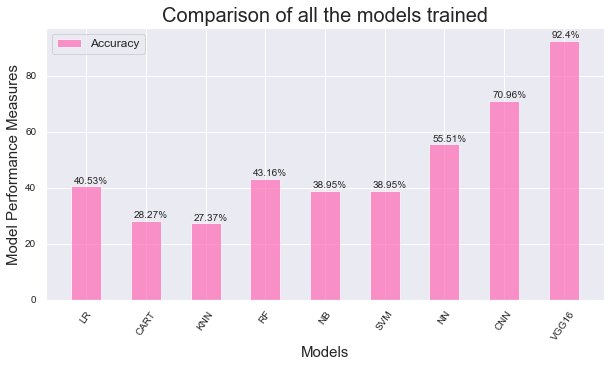

In [91]:
#Creating a graph of multiple bars
ig, ax = plt.subplots(figsize=(10,5))
n_groups = 9
index = np.arange(n_groups)
# index = label
bar_width = 0.5
opacity = .7
acc_bar = ax.bar(index, results, bar_width, alpha=opacity, color='Hotpink', label='Accuracy')
# mis_bar = ax.bar(index + bar_width, mis_arr, bar_width, alpha=opacity, color='orangered', label='Misclassification')

ax.set_xlabel('Models',  fontsize = 15)
ax.set_ylabel('Model Performance Measures',  fontsize = 15)
ax.set_title('Comparison of all the models trained',  fontsize = 20)
ax.set_xticks(index + bar_width - 0.5)
ax.set_xticklabels(names, fontsize = 14)
ax.tick_params(labelsize=10)

for index,data in enumerate(results):
    data = round(data, 2)
    plt.text(x=index - 0.2 , y = data+1 , s=f"{data}%" , fontdict=dict(fontsize=10))
    
#Changing alignment of labels in x axis
for c in ax.get_xticklabels():
    c.set_rotation(55)
    
ax.legend(fontsize = 12, loc = 'best')

plt.show()

- As evident in the above graph, the best AIML model for flower species prediction is the Transfer Learning Model VGG16 with an accuracy of 92.4%. It out performed ANN and CNN which reached an accuracy level of 55.51% & 70.96% respectively.
- In this case, ANN performance was not good as compared to CNN and VGG16.
- Whereas, the Supervised Learning models accuracy range was between 27% to 44%. Amongst which, Random Forest scored the highest.

###  Creating a GUI to import the image “Prediction.jpg” and use the above designed best AIML image classification model to predict the class/label of this image.

In [189]:
import tkinter as tk
from tkinter import ttk 
import re
from tensorflow.keras.models import Sequential, save_model, load_model
import cv2
from tensorflow.keras.preprocessing import image
import numpy as np
# import load

win = tk.Tk()
win.title('Classifier GUI - Great Learning')

name=ttk.Label(win,text='Step 1: File Name')
name.grid(row=0,column=0,sticky=tk.W)

name_var=tk.StringVar()
name_entrybox=ttk.Entry(win,width=16,textvariable=name_var)
name_entrybox.grid(row=0,column=1)

def Import_image():
    global img
    img_path = name_var.get()
    img = image.load_img(img_path, target_size=(227, 227))

    confirm='Done'
    confirm_entrybox=ttk.Entry(win,width=16)
    confirm_entrybox.grid(row=0,column=3)
    confirm_entrybox.insert(1,str(confirm))


Import_button=ttk.Button(win,text='Import Data',command=Import_image)
Import_button.grid(row=0,column=2)

target=ttk.Label(win,text='Image Classifier')
target.grid(row=1,column=0,sticky=tk.W)

def Predict():
    global model 
    category_gui = ['Daffodil','Snowdrop','Common Daisy','Common Bluebell','Autumn Crocus','Iris Germanica','Caroline Lily','Crocus Flavus','Fritillaria Cirrhosa','Sunflower','Lily of the Valley','Coltsfoot','Common Dandelion','Cowslip','Meadow Buttercup','Wood Anemone','Pansy']

    img_array = image.img_to_array(img)
    img_batch = np.expand_dims(img_array, axis=0)
    pred_img = img_batch / 255
    
    
    gui_model = load_model('VGG_Model_P4.h5')
    prediction=gui_model.predict(pred_img)
    predict_classes=np.argmax(prediction,axis=1)

    confirm=category_gui[predict_classes[0]]
    confirm_entrybox=ttk.Entry(win,width=16)
    confirm_entrybox.grid(row=2,column=3)
    confirm_entrybox.insert(1,str(confirm))
    print(confirm)
Predict_button=ttk.Button(win,text='Predict',command=Predict)
Predict_button.grid(row=2,column=1)

win.mainloop()

Common Daisy


- Imported the prediction image of a Common Daisy and the model predicted the flower species accurately.

# Part 5
 -<b> Strategy to maintain and support the AIML image classifier after it in production.</b>

 - Retrain the model with new data: When the model produced high accuracy score and negative test accuracy is also significantly high, get the reconstruction error value from the AE model with recent data. If the reconstruction error value is low the data is not changed much. The next best action will be retraining the model with recent data.
  
 - Retrain the model with additional features: When the model produced a low accuracy score on both positive and negative dataset accuracy is significantly high.  , the reconstruction error value is low that indicates that data is not changed much but we need to tune the model with new features.
 
 - In particular, the expectation is that the model will continuously and automatically identify where it makes mistakes, find optimal ways to rectify those mistakes, and incorporate those changes in the system, all with almost no human intervention.

 - Changes in Data Interpretation: As new business models emerge, existing businesses venture into adjacent spaces, mergers, and acquisitions happen, and the human interpretation of a particular activity may change over time. This dynamic nature of data and its interpretation has serious implications for our machine learning model.

 - Proactive Model Monitoring: The next best thing to do is to continuously track the health of the machine learning model against a set of key indicators and generate specific event-based alerts. A slightly more advanced pattern could be based on the machine learning technique used. We can quantify the word distribution in the training data using modeling techniques like Gaussian Mixture Models (GMM). Now, given a test data sample, find the probability of the sample given the GMM. All data samples with a probability lower than a certain threshold can be marked as ‘non-representative’  (i.e., anomalous) and sent to the domain experts for further investigation.

 - Reactive Model Monitoring: Reactive model monitoring is quite similar to that of proactive model monitoring. But there are subtle differences in terms of the end goals.Whereas proactive model maintenance identified general patterns in the test data which are outliers compared to those in the training data, the goal of Reactive Model Maintenance is to identify what led to an erroneous output in a specific test sample and how it can be rectified

 - Address the Root Cause, Not the Symptoms - Given these wide varieties of sources that may lead to a drop in performance of the ML-systems over time and the intense pressure to fix the issues within a given SLA, it can be tempting to have a ‘thin-layer-of-rules’ which bypasses the ML machinery completely to address the immediate customer escalation.